# Mapping Census Data

In this notebook we explore querying Census.gov for 
What data do we want to pull from the census API?

### Continual Evolution of Census API

Here is the content of a 23 June 2018 e-mail to developers using the census.gov API

```
About a year ago, the U.S. Census Bureau began the process of centralizing all data in the Census API into a uniform and consistent format across all datasets and surveys. We are continuing with that transformation by releasing a more consistent format for the 2010 Decennial Summary File 1 (SF1) counts. We understand that standardization means changes for our developers, but the tradeoff will be greater data accessibility in an easier, more customer-focused experience.

We released new endpoints as a Beta to allow time for you to become familiar with the new format and adjust your programs to reflect these changes. In addition to new endpoints, you also will see changes to variable names and new annotation fields. To accommodate this format change, the endpoints will change to add program name (e.g., '/dec/') into the URL after the year. The old endpoints will be removed on August 30th.

ENDPOINT CHANGE:
Old endpoint: https://api.census.gov/data/2010/sf1
New endpoint: https://api.census.gov/data/2010/dec/sf1

VARIABLE NAME CHANGES: Please note the changes to some variable names.
H00010001 is now H001001, and PCT0210001 is now PCT021001, for example.  A complete variable mapping is not available.


ANNOTATION FIELDS: These endpoints now include annotation fields for many counts. This will enable the counts to be numeric and the character overrides to be stored in corresponding annotation fields. For example, the annotation field for H001001 is H001001ERR. The variables with corresponding annotation fields include:
H001001,H002001,H003001,H003002,H003003,H004001,H005001,H006001,H007001,
H010001,H011001,H013001,H014001,H015001,H016001,H017001,H018001,H019001,
H020001,H021001,HCT001001,HCT002001,HCT003001,HCT004001,P001001,P002001,
P003001,P004001,P005001,P008001,P009001,P012001,P013G002,P013H001,P013H002,
P015001,P016001,P018001,P019001,P020001,P021001,P022001,P023001,P024001, P025001,P026001,P027001,P028001,P029001,P029002,P029026,P030001,P042001,
P043001,P044001,P051001,PCO001001,PCT011001,PCT012001,PCT013001,PCT014001,
PCT015001,PCT016001,PCT020001
```

### Mapping tools Available

There are a number of mapping tools available for use with Python

* `GeoPandas` has built in mapping tools using `matplotlib`
* [`Folium`]() is a Python mapping package built around [`Leaf.js`]()
* [`Altair`() is a visualization package based on the [Vega graphics grammar]()

In [26]:
from census import Census
import altair as alt
import matplotlib.pyplot as plt
import numpy as np
import folium
import json
import pycurl
import geopandas as gpd
from us import states
import os
from zipfile import ZipFile
from io import BytesIO
from urllib.request import urlopen
import fiona; fiona.supported_drivers

```Python
from [census]() import Census
import [altair]() as alt
import [matplotlib.pyplot]() as plt
import [numpy]() as np
import [folium]()
import [json]()
import [pycurl]()
import [geopandas]() as gpd
from [us](https://pypi.org/project/us/) import states
import [os]()
from [zipfile]() import ZipFile
from io import [BytesIO]()
from [urllib.request]() import urlopen
import [fiona](); fiona.supported_drivers
```

In [2]:
%matplotlib inline

In [3]:
#!conda install pycurl -y
alt.renderers.enable('notebook')


RendererRegistry.enable('notebook')

## Asssume census key is stored

In order to use the Census API, you need to have an [API key](https://en.wikipedia.org/wiki/Application_programming_interface_key). You can request a Census.gov API key [here](https://api.census.gov/data/key_signup.html).

You should keep your API key private/secret. For this notebook we assume that your key is stored in your home directory as follows:

```bash
$HOME/.census/key.txt
```

We can read the key in as follows:

In [6]:
with open(os.path.join(os.path.expanduser("~"),".census","key.txt")) as f:
    key = f.read().strip()

### Using [`us.states`](https://pypi.org/project/us/) package


The `us` package provides conveniences for working with the census.gov website, as well as information about the states themselves such

For

In [101]:
states.AK.is_contiguous

False

In [7]:
c = Census(key)
c.acs5.get(('NAME', 'B19001H_007E'),
          {'for': 'state:{}'.format(states.UT.fips)})

[{'NAME': 'Utah', 'B19001H_007E': 32805.0, 'state': '49'}]

In [8]:
c.sf1.state_county_tract('NAME', states.UT.fips, '17', Census.ALL)

[{'NAME': 'Census Tract 3', 'state': '49', 'county': '017', 'tract': '000300'},
 {'NAME': 'Census Tract 4', 'state': '49', 'county': '017', 'tract': '000400'}]

In [9]:
c.acs5.state('NAME', '49')

[{'NAME': 'Utah', 'state': '49'}]

# Here we're working with the UT shapefiles

### Use [tempfile](https://docs.python.org/3/library/tempfile.html)
* Keeps from cluttering user's directory

In [11]:

# save tract url as zip
import tempfile
#with tempfile.TemporaryFile() as f
#with open('block.zip', 'wb') as f:
def get_shape_files(geography="county"):
    with tempfile.NamedTemporaryFile(suffix=".zip", mode="wb", delete = False) as fp:
        c = pycurl.Curl()
        c.setopt(c.URL, states.UT.shapefile_urls()[geography])
        c.setopt(c.WRITEDATA, fp)
        c.perform()
        c.close()
    print(fp.name)
    print(os.path.exists(fp.name))

    data = gpd.read_file(f"zip://{fp.name}")
    os.remove(fp.name)
    return data

In [12]:
#utah_block = get_shape_files("block")
utah_blockgroup = get_shape_files("blockgroup")

/tmp/tmp8vnuyo8q.zip
True


In [13]:
utah_blockgroup.columns

Index(['STATEFP10', 'COUNTYFP10', 'TRACTCE10', 'BLKGRPCE10', 'GEOID10',
       'NAMELSAD10', 'MTFCC10', 'FUNCSTAT10', 'ALAND10', 'AWATER10',
       'INTPTLAT10', 'INTPTLON10', 'geometry'],
      dtype='object')

In [14]:
slc_blockgroup = utah_blockgroup[utah_blockgroup["COUNTYFP10"]=="035"]

In [15]:
c = Census(key, 2010)
sl_county_var = c.acs5.get(('NAME', 'B19013_001E'),
          {'for': "block group:*", 'in': "state:49 county:35"})
slc_income = gpd.GeoDataFrame.from_dict(sl_county_var)
slc_income.head()

,B19013_001E,NAME,block group,county,state,tract
0,27625.0,"Block Group 1, Census Tract 1001, Salt Lake Co...",1,035,49,100100
1,43646.0,"Block Group 2, Census Tract 1001, Salt Lake Co...",2,035,49,100100
2,103170.0,"Block Group 1, Census Tract 1002, Salt Lake Co...",1,035,49,100200
3,35775.0,"Block Group 1, Census Tract 1003.06, Salt Lake...",1,035,49,100306
4,38281.0,"Block Group 2, Census Tract 1003.06, Salt Lake...",2,035,49,100306


In [16]:
slc_income["tract_bg"] = \
    slc_income.apply(lambda row: (row["tract"],
                                          row["block group"]),
                     axis=1)
slc_income.head()

,B19013_001E,NAME,block group,county,state,tract,tract_bg
0,27625.0,"Block Group 1, Census Tract 1001, Salt Lake Co...",1,035,49,100100,"(100100, 1)"
1,43646.0,"Block Group 2, Census Tract 1001, Salt Lake Co...",2,035,49,100100,"(100100, 2)"
2,103170.0,"Block Group 1, Census Tract 1002, Salt Lake Co...",1,035,49,100200,"(100200, 1)"
3,35775.0,"Block Group 1, Census Tract 1003.06, Salt Lake...",1,035,49,100306,"(100306, 1)"
4,38281.0,"Block Group 2, Census Tract 1003.06, Salt Lake...",2,035,49,100306,"(100306, 2)"


In [17]:
slc_blockgroup.head(2)

,STATEFP10,COUNTYFP10,TRACTCE10,BLKGRPCE10,GEOID10,NAMELSAD10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,geometry
55,49,035,111802,2,490351118022,Block Group 2,G5030,S,729985,0,+40.7026578,-111.8585194,"POLYGON ((-111.865455 40.699886, -111.865458 4..."
56,49,035,110900,2,490351109002,Block Group 2,G5030,S,968849,0,+40.6697512,-111.8128025,"POLYGON ((-111.806536 40.674937, -111.80648 40..."


In [18]:
slc_blockgroup["tract_bg"] = \
    slc_blockgroup.apply(lambda row: (row["TRACTCE10"],
                                  row["BLKGRPCE10"]),
                     axis=1)
slc_blockgroup.head()

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


,STATEFP10,COUNTYFP10,TRACTCE10,BLKGRPCE10,GEOID10,NAMELSAD10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,geometry,tract_bg
55,49,035,111802,2,490351118022,Block Group 2,G5030,S,729985,0,+40.7026578,-111.8585194,"POLYGON ((-111.865455 40.699886, -111.865458 4...","(111802, 2)"
56,49,035,110900,2,490351109002,Block Group 2,G5030,S,968849,0,+40.6697512,-111.8128025,"POLYGON ((-111.806536 40.674937, -111.80648 40...","(110900, 2)"
57,49,035,113522,2,490351135222,Block Group 2,G5030,S,1297374,0,+40.6603473,-111.9626660,"POLYGON ((-111.967442 40.66385, -111.967442 40...","(113522, 2)"
58,49,035,113514,1,490351135141,Block Group 1,G5030,S,604541,0,+40.6666599,-111.9311412,"POLYGON ((-111.927894 40.67017, -111.927592 40...","(113514, 1)"
59,49,035,113523,3,490351135233,Block Group 3,G5030,S,749974,0,+40.6426932,-111.9816886,"POLYGON ((-111.98275 40.638571, -111.982793 40...","(113523, 3)"


In [19]:
slc_blockgroup.shape, slc_income.shape

((612, 14), (612, 7))

In [20]:
slc_census_income = slc_blockgroup.merge(slc_income, how='inner', 
                    on="tract_bg"
                   )
slc_census_income.crs = {'init' :'epsg:4326'}
slc_census_income.head(3)

,STATEFP10,COUNTYFP10,TRACTCE10,BLKGRPCE10,GEOID10,NAMELSAD10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,geometry,tract_bg,B19013_001E,NAME,block group,county,state,tract
0,49,035,111802,2,490351118022,Block Group 2,G5030,S,729985,0,+40.7026578,-111.8585194,"POLYGON ((-111.865455 40.699886, -111.865458 4...","(111802, 2)",53370.0,"Block Group 2, Census Tract 1118.02, Salt Lake...",2,035,49,111802
1,49,035,110900,2,490351109002,Block Group 2,G5030,S,968849,0,+40.6697512,-111.8128025,"POLYGON ((-111.806536 40.674937, -111.80648 40...","(110900, 2)",85250.0,"Block Group 2, Census Tract 1109, Salt Lake Co...",2,035,49,110900
2,49,035,113522,2,490351135222,Block Group 2,G5030,S,1297374,0,+40.6603473,-111.9626660,"POLYGON ((-111.967442 40.66385, -111.967442 40...","(113522, 2)",78884.0,"Block Group 2, Census Tract 1135.22, Salt Lake...",2,035,49,113522


In [21]:
np.mean(slc_census_income["B19013_001E"])

63142.219672131148

In [22]:
slc_census_income["INTPTLAT10"] = \
    slc_census_income["INTPTLAT10"].apply(lambda x:float(x))
slc_census_income["INTPTLON10"] = \
    slc_census_income["INTPTLON10"].apply(lambda x:float(x))

/opt/conda/lib/python3.6/site-packages/matplotlib/colors.py:504: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


(-112.2990313, -111.5175627, 40.38872349999999, 40.947446499999991)

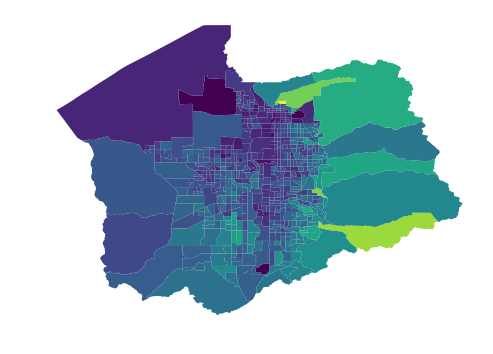

In [23]:
fig0, ax0 = plt.subplots()
fig0.set_size_inches(8,8)
slc_census_income.plot(column="B19013_001E", ax=ax0)
ax0.set_aspect("equal")
ax0.axis("off")


### Dealing with missing values

Two of our blockgroups have missing values:

```
tract_bg       (980000, 1)
B19013_001E            NaN
Name: 549, dtype: object
tract_bg       (112818, 1)
B19013_001E            NaN
Name: 562, dtype: object
```

When we convert these values to topojson for altair we are get an error when rendering our map:

```
Javascript Error: Argument 1 of CanvasGradient.addColorStop is not a finite floating-point value.

This usually means there's a typo in your chart specification. See the JavaScript console for the full traceback.

```

In [45]:
for _, row in slc_census_income[['tract_bg','B19013_001E']].iterrows():
    if np.isnan(row['B19013_001E']):
        print(row)

tract_bg       (980000, 1)
B19013_001E            NaN
Name: 549, dtype: object
tract_bg       (112818, 1)
B19013_001E            NaN
Name: 562, dtype: object


### First Approach: `dropna`

In [79]:
slc_census_income["rank"] = range(612)
json_features = json.loads(slc_census_income.dropna().to_json())
data_geo = alt.Data(values=json_features['features'])

In [70]:
np.array([v['properties']['B19013_001E'] for v in data_geo["values"]])


array([  53370.,   85250.,   78884.,   46303.,   55263.,   48409.,
         50400.,   23750.,  121354.,   64926.,   83068.,  112772.,
         38611.,   69706.,   71557.,   58698.,   39277.,   78203.,
         76375.,   91414.,   65568.,   49643.,   48029.,   98611.,
         97727.,  124792.,   80833.,   70887.,   62875.,   52500.,
        186595.,   80950.,   33636.,  130500.,  108068.,  103404.,
         56172.,   60393.,  117986.,   51563.,   80545.,   85119.,
         71250.,   47011.,   41799.,   43052.,   27625.,   59458.,
         52292.,   45703.,   49215.,   57917.,   75000.,   61250.,
        106458.,   97344.,   81422.,   45583.,  132500.,  105625.,
         78320.,   43041.,   75789.,   58846.,   71818.,   58542.,
         47763.,   70625.,  100754.,  101442.,   74432.,  104375.,
        100625.,   95110.,   51378.,   81563.,   65750.,   97222.,
         65074.,   94234.,   35455.,  100781.,   61118.,  100625.,
         45444.,   44500.,   50400.,   35282.,   31500.,   637

In [56]:
for bb in json_features['features']:
    if bb["properties"]["tract_bg"] in (['980000', '1'],
                                        ['112818', '1']):
        print(bb["properties"]["tract_bg"], type(bb["properties"]["tract_bg"]))
        print(bb["properties"]["B19013_001E"])
        print("*"*42)

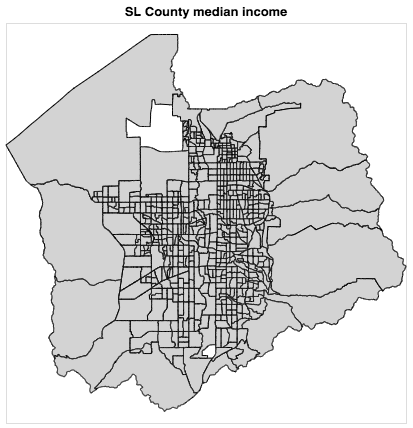

In [80]:
chart = alt.Chart(data_geo, title="SL County median income").mark_geoshape(
        fill='lightgray',
        stroke='black'
    ).properties(
        width=400,
        height=400
    )

chart

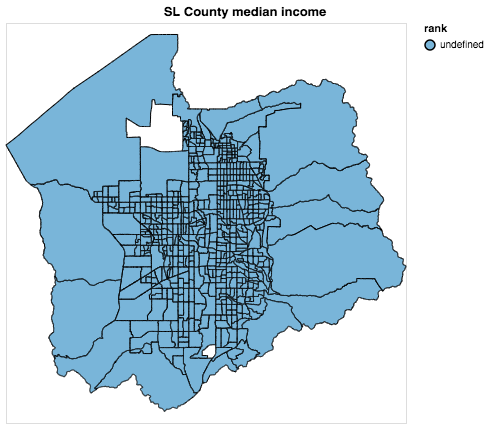

In [95]:
chart = alt.Chart(data_geo, title="SL County median income").mark_geoshape(
        fill='lightgray',
        stroke='black'
    ).properties(
        width=400,
        height=400
    ).encode(color="rank:O"
    )

chart

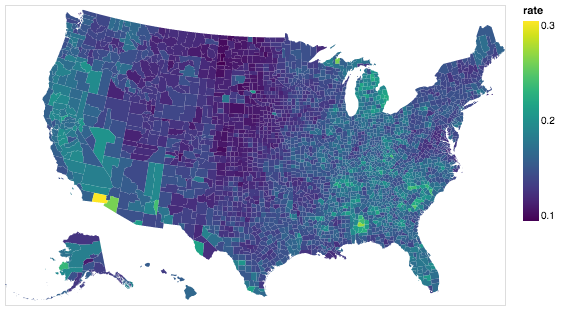

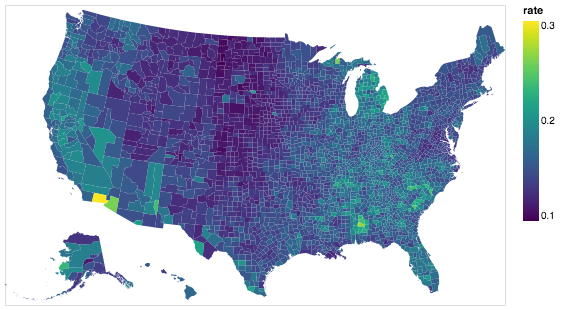

In [89]:
import altair as alt
from vega_datasets import data

counties = alt.topo_feature(data.us_10m.url, 'counties')
unemp_data = data.unemployment.url


alt.Chart(counties).mark_geoshape().encode(
    color='rate:Q'
).transform_lookup(
    lookup='id',
    from_=alt.LookupData(unemp_data, 'id', ['rate'])
).project(
    type='albersUsa'
).properties(
    width=500,
    height=300
)

In [77]:
m = folium.Map(location=[np.mean(slc_census_income["INTPTLAT10"]), 
                         np.mean(slc_census_income["INTPTLON10"])], 
               #tiles="Stamen Toner", 
               zoom_start=10.5)
m.choropleth(geo_data=slc_census_income, 
             data = slc_census_income,
             key_on='feature.properties.NAME',
             columns=['NAME', 
                      "B19013_001E"],
             fill_opacity=0.7,
             line_opacity=0.8,
             fill_color='BuPu')
m

In [ ]:
%debug

In [ ]:
utah_blockgroup["COUNTYFP10"].unique()

In [ ]:
fig0, ax0 = plt.subplots()
fig0.set_size_inches(8,6)
slc_blockgroup.plot(ax=ax0)
ax0.set_aspect("equal")
ax0.axis("off")

In [ ]:
utah_block.head(20)

In [ ]:
fig, ax = plt.subplots()
fig.set_size_inches(8,6)
utah_block.plot(ax=ax)
ax.set_aspect("equal")
ax.axis("off")

In [ ]:
alt.topo_feature(uc)

In [ ]:
import altair as alt
from vega_datasets import data

states = alt.topo_feature(data.us_10m.url, 'states')
capitals = data.us_state_capitals.url

# US states background
background = alt.Chart(states).mark_geoshape(
    fill='lightgray',
    stroke='white'
).properties(
    title='US State Capitols',
    width=700,
    height=400
).project('albersUsa')

# Points and text
hover = alt.selection(type='single', on='mouseover', nearest=True,
                      fields=['lat', 'lon'])

base = alt.Chart(capitals).encode(
    longitude='lon:Q',
    latitude='lat:Q'
)

text = base.mark_text(dy=-5, align='right').encode(
    alt.Text('city', type='nominal'),
    opacity=alt.condition(~hover, alt.value(0), alt.value(1))
)

points = base.mark_point().encode(
    color=alt.value('black'),
    size=alt.condition(~hover, alt.value(30), alt.value(100))
).add_selection(hover)

background + points + text

In [ ]:
capitals

In [ ]:
import pathlib
uc = pathlib.Path(os.path.join(os.getcwd(),"utah_counties.json")).as_uri()


In [ ]:
states_gdf.to_file("utah_counties.json", driver="GeoJSON")

In [ ]:
counties = alt.topo_feature("file://%s/%s"%(os.getcwd(),"test.json"), 'properties')


In [ ]:
alt.Chart(counties).mark_geoshape().encode(
    color='rate:Q'
).project(
    type='albersUsa'
).properties(
    width=500,
    height=300
)

In [ ]:
states.UT.shapefile_urls()

In [ ]:
#extract all files from zip
with ZipFile('block.zip', 'r') as myzip:
    myzip.extractall()

In [ ]:
gpd.read_file?

In [ ]:
import geopandas as gpd
utah = gpd.read_file("tl_2010_49_tabblock10.shp")

In [ ]:
utah

In [ ]:
from IPython.display import display

utah.plot()

In [ ]:
alt.top_feature

In [ ]:
import altair as alt
from vega_datasets import data
alt.renderers.enable('notebook')
counties = alt.topo_feature(data.us_10m.url, 'counties')
unemp_data = data.unemployment.url


alt.Chart(counties).mark_geoshape().encode(
    color='rate:Q'
).transform_lookup(
    lookup='id',
    from_=alt.LookupData(unemp_data, 'id', ['rate'])
).project(
    type='albersUsa'
).properties(
    width=500,
    height=300
)

In [ ]:
data.us_10m.url

In [ ]:
alt.topo_feature?

In [ ]:
import census

https://github.com/altair-viz/altair/issues/588

In [ ]:
census.